In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import re
import time
import warnings
import numpy as np
#from nltk.corpus import stopwords
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics.classification import accuracy_score, log_loss
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import SGDClassifier
#from imblearn.over_sampling import SMOTE
from collections import Counter
#from scipy.sparse import hstack
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold 
from collections import Counter, defaultdict
from sklearn.calibration import CalibratedClassifierCV
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
import math
from sklearn.metrics import normalized_mutual_info_score
from sklearn.ensemble import RandomForestClassifier
warnings.filterwarnings("ignore")

from mlxtend.classifier import StackingClassifier

from sklearn import model_selection
from sklearn.linear_model import LogisticRegression


In [36]:
%matplotlib notebook

In [2]:
train = pd.read_csv(r'C:\Users\Admin\Desktop\DS Assignment\3c055e822d5b11ea\train.csv')
print('Number of data points : ', train.shape[0])
print('Number of features : ', train.shape[1])
print('Features : ', train.columns.values)
train.head()

Number of data points :  10000
Number of features :  12
Features :  ['Severity' 'Safety_Score' 'Days_Since_Inspection'
 'Total_Safety_Complaints' 'Control_Metric' 'Turbulence_In_gforces'
 'Cabin_Temperature' 'Accident_Type_Code' 'Max_Elevation' 'Violations'
 'Adverse_Weather_Metric' 'Accident_ID']


,Severity,Safety_Score,Days_Since_Inspection,Total_Safety_Complaints,Control_Metric,Turbulence_In_gforces,Cabin_Temperature,Accident_Type_Code,Max_Elevation,Violations,Adverse_Weather_Metric,Accident_ID
0,Minor_Damage_And_Injuries,49.223744,14,22,71.285324,0.272118,78.04,2,31335.476824,3,0.424352,7570
1,Minor_Damage_And_Injuries,62.465753,10,27,72.288058,0.423939,84.54,2,26024.711057,2,0.352350,12128
2,Significant_Damage_And_Fatalities,63.059361,13,16,66.362808,0.322604,78.86,7,39269.053927,3,0.003364,2181
3,Significant_Damage_And_Serious_Injuries,48.082192,11,9,74.703737,0.337029,81.79,3,42771.499200,1,0.211728,5946
4,Significant_Damage_And_Fatalities,26.484018,13,25,47.948952,0.541140,77.16,3,35509.228515,2,0.176883,9054


In [3]:
train.shape

(10000, 12)

In [4]:
train.isnull().any()

Severity                   False
Safety_Score               False
Days_Since_Inspection      False
Total_Safety_Complaints    False
Control_Metric             False
Turbulence_In_gforces      False
Cabin_Temperature          False
Accident_Type_Code         False
Max_Elevation              False
Violations                 False
Adverse_Weather_Metric     False
Accident_ID                False
dtype: bool

In [5]:
train.dtypes

Severity                    object
Safety_Score               float64
Days_Since_Inspection        int64
Total_Safety_Complaints      int64
Control_Metric             float64
Turbulence_In_gforces      float64
Cabin_Temperature          float64
Accident_Type_Code           int64
Max_Elevation              float64
Violations                   int64
Adverse_Weather_Metric     float64
Accident_ID                  int64
dtype: object

In [3]:
test = pd.read_csv(r'C:\Users\Admin\Desktop\DS Assignment\3c055e822d5b11ea\test.csv')
print('Number of data points : ', train.shape[0])
print('Number of features : ', train.shape[1])
print('Features : ', train.columns.values)
train.head()

Number of data points :  10000
Number of features :  12
Features :  ['Severity' 'Safety_Score' 'Days_Since_Inspection'
 'Total_Safety_Complaints' 'Control_Metric' 'Turbulence_In_gforces'
 'Cabin_Temperature' 'Accident_Type_Code' 'Max_Elevation' 'Violations'
 'Adverse_Weather_Metric' 'Accident_ID']


,Severity,Safety_Score,Days_Since_Inspection,Total_Safety_Complaints,Control_Metric,Turbulence_In_gforces,Cabin_Temperature,Accident_Type_Code,Max_Elevation,Violations,Adverse_Weather_Metric,Accident_ID
0,Minor_Damage_And_Injuries,49.223744,14,22,71.285324,0.272118,78.04,2,31335.476824,3,0.424352,7570
1,Minor_Damage_And_Injuries,62.465753,10,27,72.288058,0.423939,84.54,2,26024.711057,2,0.352350,12128
2,Significant_Damage_And_Fatalities,63.059361,13,16,66.362808,0.322604,78.86,7,39269.053927,3,0.003364,2181
3,Significant_Damage_And_Serious_Injuries,48.082192,11,9,74.703737,0.337029,81.79,3,42771.499200,1,0.211728,5946
4,Significant_Damage_And_Fatalities,26.484018,13,25,47.948952,0.541140,77.16,3,35509.228515,2,0.176883,9054


In [7]:
test.isnull().any()

Safety_Score               False
Days_Since_Inspection      False
Total_Safety_Complaints    False
Control_Metric             False
Turbulence_In_gforces      False
Cabin_Temperature          False
Accident_Type_Code         False
Max_Elevation              False
Violations                 False
Adverse_Weather_Metric     False
Accident_ID                False
dtype: bool

In [10]:
train['Severity'].value_counts()

Highly_Fatal_And_Damaging                  3049
Significant_Damage_And_Serious_Injuries    2729
Minor_Damage_And_Injuries                  2527
Significant_Damage_And_Fatalities          1695
Name: Severity, dtype: int64

In [12]:
%matplotlib notebook

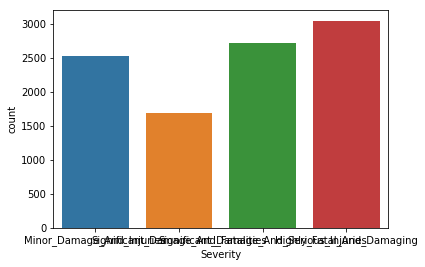

In [285]:
sns.countplot(train['Severity'])

#target varibale is imbalanced 

In [19]:
%matplotlib notebook

In [14]:
train.describe()

,Safety_Score,Days_Since_Inspection,Total_Safety_Complaints,Control_Metric,Turbulence_In_gforces,Cabin_Temperature,Accident_Type_Code,Max_Elevation,Violations,Adverse_Weather_Metric,Accident_ID
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000
mean,41.876406,12.931100,6.564300,65.145324,0.381495,79.969331,3.814900,32001.803282,2.01220,0.255635,6266.554200
std,16.138072,3.539803,6.971982,11.882934,0.121301,2.759739,1.902577,9431.995196,1.03998,0.381128,3610.170288
min,0.000000,1.000000,0.000000,0.000000,0.134000,74.740000,1.000000,831.695553,0.00000,0.000316,2.000000
25%,30.593607,11.000000,2.000000,56.927985,0.293665,77.960000,2.000000,25757.636908,1.00000,0.012063,3139.750000
50%,41.278539,13.000000,4.000000,65.587967,0.365879,79.540000,4.000000,32060.336419,2.00000,0.074467,6280.500000
75%,52.511416,15.000000,9.000000,73.336372,0.451346,81.560000,5.000000,38380.641513,3.00000,0.354059,9391.500000
max,100.000000,23.000000,54.000000,100.000000,0.882648,97.510000,7.000000,64297.651218,5.00000,2.365378,12500.000000


In [23]:
%matplotlib inline

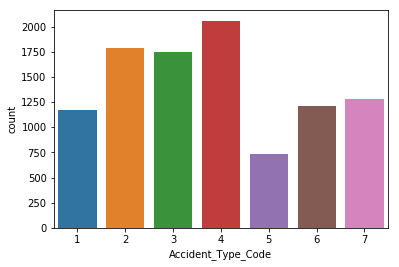

In [24]:
sns.countplot(train['Accident_Type_Code'])

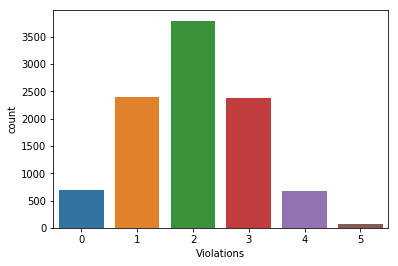

In [26]:
sns.countplot(train['Violations'])

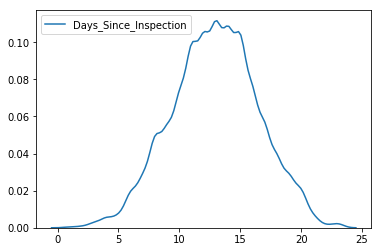

In [27]:
sns.kdeplot(train['Days_Since_Inspection'])

In [28]:
train['Days_Since_Inspection'].describe()

count    10000.000000
mean        12.931100
std          3.539803
min          1.000000
25%         11.000000
50%         13.000000
75%         15.000000
max         23.000000
Name: Days_Since_Inspection, dtype: float64

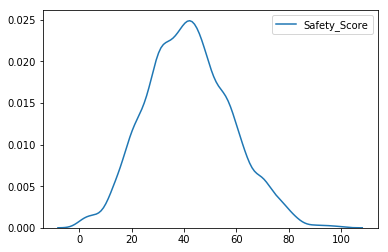

In [29]:
sns.kdeplot(train['Safety_Score'])

In [42]:
train['Safety_Score'].describe()

count    10000.000000
mean        41.876406
std         16.138072
min          0.000000
25%         30.593607
50%         41.278539
75%         52.511416
max        100.000000
Name: Safety_Score, dtype: float64

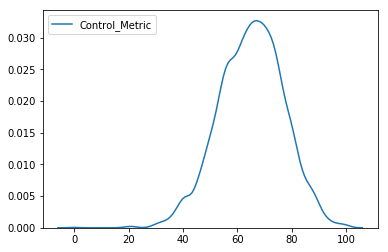

In [386]:
sns.kdeplot(train['Control_Metric'])

In [387]:
train['Control_Metric'].describe()

count    10000.000000
mean        65.145324
std         11.882934
min          0.000000
25%         56.927985
50%         65.587967
75%         73.336372
max        100.000000
Name: Control_Metric, dtype: float64

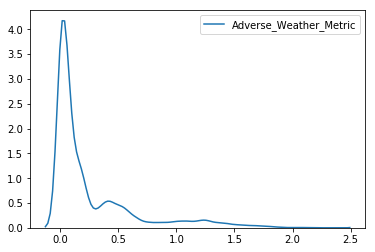

In [389]:
sns.kdeplot(train['Adverse_Weather_Metric'])

<IPython.core.display.Javascript object>


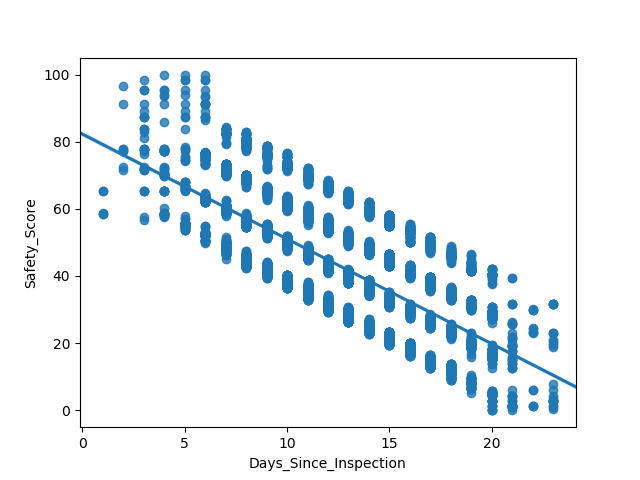

In [35]:
sns.regplot(y = "Safety_Score",x = "Days_Since_Inspection", data = train)

#From the above plot we can say if Days_Since_Inspection increases safety score 
  will decreases that means if inception is not 
   done regularly that causes accident

<IPython.core.display.Javascript object>


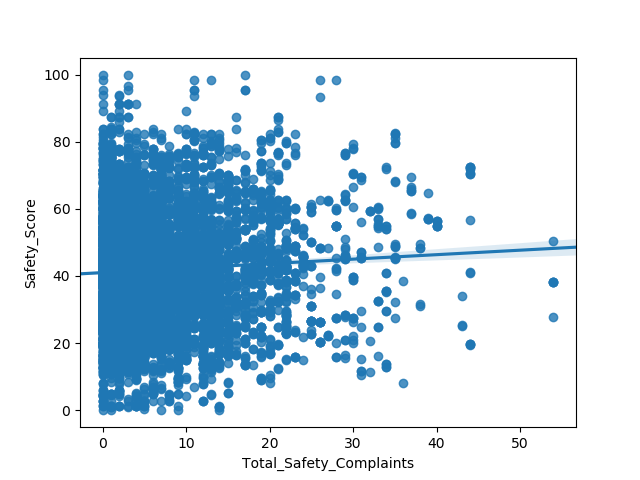

In [41]:
sns.regplot(y= "Safety_Score",x= "Total_Safety_Complaints", data = train)

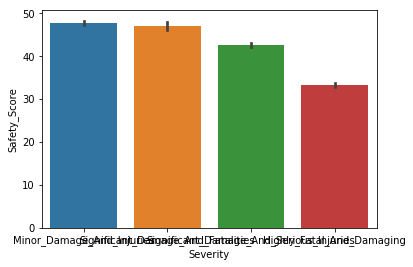

In [ ]:
First we build a base model with data

In [286]:
data = train.copy()

In [287]:
y = data['Severity']

In [288]:
data = data.drop('Severity',axis=1)

In [289]:
data = data.drop('Accident_ID',axis=1)

In [290]:
from sklearn.model_selection import train_test_split

train_x,test_x,train_y,test_y =  train_test_split(data, y,  test_size=0.3)
train_df, cv_df, y_train, y_cv = train_test_split(train_x, train_y, test_size=0.2)

for alpha = 1e-06
Log Loss : 1.3650625158839595
for alpha = 1e-05
Log Loss : 1.3650625158839595
for alpha = 0.0001
Log Loss : 1.3650625158839595
for alpha = 0.001
Log Loss : 1.3650625158839595
for alpha = 0.01
Log Loss : 1.326792745115959
for alpha = 0.1
Log Loss : 1.3340736452184812
for alpha = 1
Log Loss : 1.354925983681702


<IPython.core.display.Javascript object>


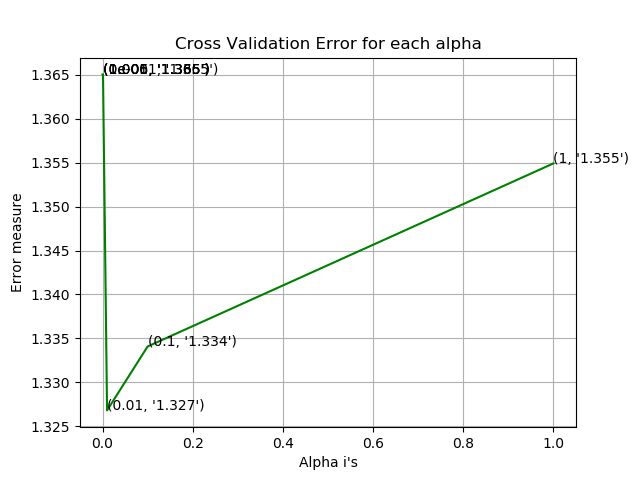

For values of best alpha =  0.01 The train log loss is: 1.325269063065172
For values of best alpha =  0.01 The cross validation log loss is: 1.326792745115959
For values of best alpha =  0.01 The test log loss is: 1.321086699687534


In [50]:
alpha = [10 ** x for x in range(-6, 1)]
cv_log_error_array = []
for i in alpha:
    print("for alpha =", i)
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(train_df, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_df, y_train)
    sig_clf_probs = sig_clf.predict_proba(cv_df)
    cv_log_error_array.append(log_loss(y_cv, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    print("Log Loss :",log_loss(y_cv, sig_clf_probs)) 

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(cv_log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(train_df, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(train_df, y_train)

predict_y = sig_clf.predict_proba(train_df)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(cv_df)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(test_x)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(test_y, predict_y, labels=clf.classes_, eps=1e-15))

In [52]:
pred_y_test = sig_clf.predict(test_x)

In [54]:
test_y.value_counts()

Highly_Fatal_And_Damaging                  933
Significant_Damage_And_Serious_Injuries    830
Minor_Damage_And_Injuries                  727
Significant_Damage_And_Fatalities          510
Name: Severity, dtype: int64

In [55]:
from sklearn.metrics.classification import f1_score

In [59]:
print (100*f1_score(test_y,pred_y_test,average='weighted'))

25.60100046358072


In [58]:
print ('accuracy ', accuracy_score(test_y,pred_y_test))

accuracy  0.35033333333333333


In [60]:
df1 = pd.DataFrame({'Actual': test_y, 'Predicted': pred_y_test})

In [61]:
df1.head()

,Actual,Predicted
2267,Highly_Fatal_And_Damaging,Highly_Fatal_And_Damaging
2945,Significant_Damage_And_Fatalities,Highly_Fatal_And_Damaging
6887,Minor_Damage_And_Injuries,Significant_Damage_And_Serious_Injuries
642,Significant_Damage_And_Fatalities,Significant_Damage_And_Serious_Injuries
4018,Highly_Fatal_And_Damaging,Highly_Fatal_And_Damaging


#Here  our base model gives 35% accuracy on test_data,now we need to perform some feature engineering task for improving accuracy

In [62]:
from xgboost import XGBClassifier

In [63]:
model = XGBClassifier(max_depth= 1,n_estimators =2000)

In [64]:
model.fit(train_df, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=1,
              min_child_weight=1, missing=None, n_estimators=2000, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [91]:
y_pred_tt = model.predict(test_x)


In [75]:
print ('accuracy ', accuracy_score(y_train,y_pred))

accuracy  0.6835714285714286


In [72]:
y_pred_test = model.predict(test_x)

In [66]:
print ('accuracy ', accuracy_score(y_cv,y_pred_cv))

accuracy  0.6585714285714286


In [93]:
print ('accuracy on test data ', accuracy_score(test_y,y_pred_tt))

accuracy on test data  0.6663333333333333


In [92]:
print (100*f1_score(test_y,y_pred_tt,average='weighted'))

65.94875916047374


In [69]:
%matplotlib inline

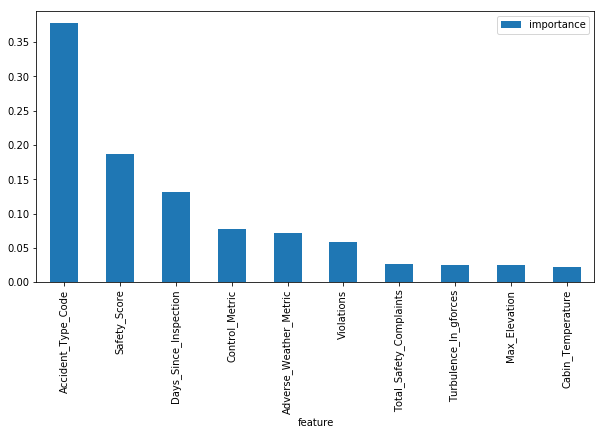

In [70]:
importances = pd.DataFrame({'feature':cv_df.columns,'importance':np.round(model.feature_importances_,3)})

importances = importances.sort_values('importance',ascending=False).set_index('feature')
importances.plot.bar(figsize=(10,5))

In [76]:
df1 = pd.DataFrame({'Actual': test_y, 'Predicted': pred_y_test})

In [77]:
df1.head()

,Actual,Predicted
2267,Highly_Fatal_And_Damaging,Highly_Fatal_And_Damaging
2945,Significant_Damage_And_Fatalities,Highly_Fatal_And_Damaging
6887,Minor_Damage_And_Injuries,Significant_Damage_And_Serious_Injuries
642,Significant_Damage_And_Fatalities,Significant_Damage_And_Serious_Injuries
4018,Highly_Fatal_And_Damaging,Highly_Fatal_And_Damaging


In [299]:
result =  test['Accident_ID']

In [300]:
test = test.drop('Accident_ID',axis =1)

In [86]:
y_pred_test = model.predict(test)


In [87]:
df_d = pd.DataFrame({'id':result,'Severity':y_pred_test})
df_d.head(10)

,Severity,id
0,Highly_Fatal_And_Damaging,1
1,Significant_Damage_And_Fatalities,10
2,Significant_Damage_And_Serious_Injuries,14
3,Highly_Fatal_And_Damaging,17
4,Highly_Fatal_And_Damaging,21
5,Minor_Damage_And_Injuries,40
6,Significant_Damage_And_Fatalities,45
7,Highly_Fatal_And_Damaging,50
8,Highly_Fatal_And_Damaging,52
9,Significant_Damage_And_Serious_Injuries,85


In [88]:
df_d.to_csv(r'C:\Users\Admin\Desktop\DS Assignment\sam4.csv')

In [99]:
df_d['Severity'].value_counts()

Highly_Fatal_And_Damaging                  831
Significant_Damage_And_Serious_Injuries    700
Minor_Damage_And_Injuries                  682
Significant_Damage_And_Fatalities          287
Name: Severity, dtype: int64

#Linear Support Vector Machines

In [94]:
alpha = [10 ** x for x in range(-5, 3)]
cv_log_error_array = []
for i in alpha:
    print("for C =", i)
    ## Balancing the classes
    clf = SGDClassifier( class_weight='balanced', alpha=i, penalty='l2', loss='hinge')
    clf.fit(train_df, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(train_df, y_train)
    sig_clf_probs = sig_clf.predict_proba(cv_df)
    cv_log_error_array.append(f1_score(y_cv, sig_clf_probs, labels=clf.classes_))
    print("Log Loss :",log_loss(y_cv, sig_clf_probs))

for C = 1e-05
Log Loss : 1.3650625158839595
for C = 0.0001
Log Loss : 1.3650625158839595
for C = 0.001
Log Loss : 1.3650625158839595
for C = 0.01
Log Loss : 1.3650625158839595
for C = 0.1
Log Loss : 1.3650625158839595
for C = 1
Log Loss : 1.3584908947522665
for C = 10
Log Loss : 1.3523770209365982
for C = 100
Log Loss : 1.338664179124013


Text(0, 0.5, 'Error measure')

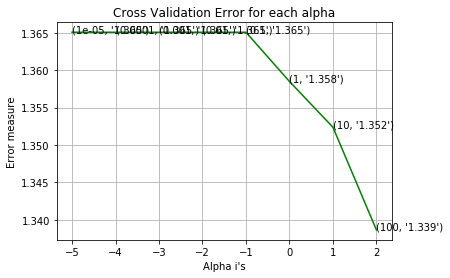

In [95]:
fig, ax = plt.subplots()
ax.plot(np.log10(alpha), cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],str(txt)), (np.log10(alpha[i]),cv_log_error_array[i]))
plt.grid()
plt.xticks(np.log10(alpha))
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")

In [106]:
pred_y = sig_clf.predict(test)

array(['Highly_Fatal_And_Damaging', 'Highly_Fatal_And_Damaging',
       'Highly_Fatal_And_Damaging', ..., 'Highly_Fatal_And_Damaging',
       'Highly_Fatal_And_Damaging', 'Highly_Fatal_And_Damaging'],
      dtype='<U39')

In [109]:
df_d = pd.DataFrame({'Severity':pred_y})
df_d['Severity'].value_counts()

Highly_Fatal_And_Damaging                  1943
Significant_Damage_And_Serious_Injuries     557
Name: Severity, dtype: int64

In [110]:
alpha = [100,200,500,1000,2000]   ## May try other values
max_depth = [5, 10]          ## May try other values
cv_log_error_array = []
for i in alpha:
    for j in max_depth:
        print("for n_estimators =", i,"and max depth = ", j)
        clf = RandomForestClassifier(n_estimators=i, criterion='gini', max_depth=j, random_state=42, n_jobs=-1)
        clf.fit(train_df, y_train)
        sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
        sig_clf.fit(train_df, y_train)
        sig_clf_probs = sig_clf.predict_proba(cv_df)
        cv_log_error_array.append(log_loss(y_cv, sig_clf_probs, labels=clf.classes_, eps=1e-15))
        print("Log Loss :",log_loss(y_cv, sig_clf_probs))

for n_estimators = 100 and max depth =  5
Log Loss : 0.7278463236350821
for n_estimators = 100 and max depth =  10
Log Loss : 0.35400758266664056
for n_estimators = 200 and max depth =  5
Log Loss : 0.7423778324671216
for n_estimators = 200 and max depth =  10
Log Loss : 0.3584117944216268
for n_estimators = 500 and max depth =  5
Log Loss : 0.7296015174462026
for n_estimators = 500 and max depth =  10
Log Loss : 0.3458076691698808
for n_estimators = 1000 and max depth =  5
Log Loss : 0.7319858271939588
for n_estimators = 1000 and max depth =  10
Log Loss : 0.34407493251425036
for n_estimators = 2000 and max depth =  5
Log Loss : 0.7298427572379789
for n_estimators = 2000 and max depth =  10
Log Loss : 0.3431289468582177


In [291]:
model = RandomForestClassifier(n_estimators=2000, criterion='gini', max_depth=10, random_state=42, n_jobs=-1)
#sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
model.fit(train_df, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=10, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=2000,
                       n_jobs=-1, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

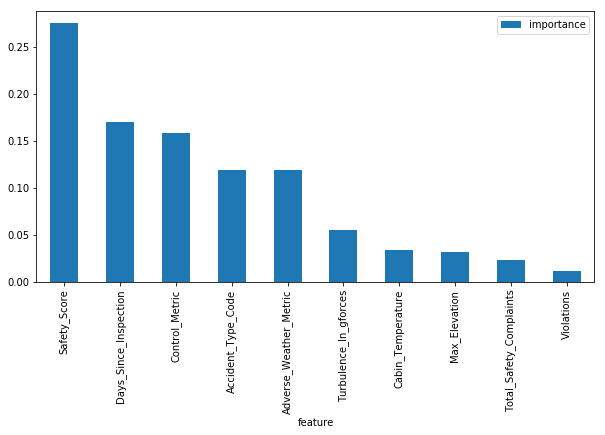

In [292]:
importances = pd.DataFrame({'feature':train_df.columns,'importance':np.round(model.feature_importances_,3)})

importances = importances.sort_values('importance',ascending=False).set_index('feature')
importances.plot.bar(figsize=(10,5))

In [301]:
pred_y =model.predict(test)

In [294]:
print ('f1_score on train data',100*f1_score(test_y,pred_y,average='weighted'))

f1_score on train data 88.48360041162132


In [302]:
df_d = pd.DataFrame({'Accident_ID':result,'Severity':pred_y})
df_d.head(10)

,Accident_ID,Severity
0,1,Highly_Fatal_And_Damaging
1,10,Significant_Damage_And_Fatalities
2,14,Significant_Damage_And_Serious_Injuries
3,17,Significant_Damage_And_Serious_Injuries
4,21,Significant_Damage_And_Fatalities
5,40,Significant_Damage_And_Fatalities
6,45,Significant_Damage_And_Fatalities
7,50,Highly_Fatal_And_Damaging
8,52,Highly_Fatal_And_Damaging
9,85,Significant_Damage_And_Serious_Injuries


In [122]:
df_d['Severity'].value_counts()

Highly_Fatal_And_Damaging                  767
Minor_Damage_And_Injuries                  663
Significant_Damage_And_Serious_Injuries    653
Significant_Damage_And_Fatalities          417
Name: Severity, dtype: int64

In [303]:
df_d.to_csv(r'C:\Users\Admin\Desktop\DS Assignment\sam4.csv')

In [137]:
data_feat_Imp = train.copy()

In [141]:
data_feat_Imp.columns

Index(['Severity', 'Safety_Score', 'Days_Since_Inspection',
       'Total_Safety_Complaints', 'Control_Metric', 'Turbulence_In_gforces',
       'Cabin_Temperature', 'Accident_Type_Code', 'Max_Elevation',
       'Violations', 'Adverse_Weather_Metric', 'Accident_ID'],
      dtype='object')

In [ ]:
y_feat_Imp_train   =  data_feat_Imp['Severity'] 

In [144]:
data_feat_Imp = data_feat_Imp.drop(['Accident_ID','Severity','Max_Elevation','Violations','Cabin_Temperature','Total_Safety_Complaints',],axis = 1)

In [145]:
from sklearn.model_selection import train_test_split

train_x,test_x,train_y,test_y =  train_test_split(data_feat_Imp, y_feat_Imp_train ,  test_size=0.3)
train_df, cv_df, y_train, y_cv = train_test_split(train_x, train_y, test_size=0.2)

In [146]:
model = RandomForestClassifier(n_estimators=2000, criterion='gini', max_depth=10, random_state=42, n_jobs=-1)
#sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
model.fit(train_df, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=10, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=2000,
                       n_jobs=-1, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [152]:
pred_y =model.predict(test_x)

In [153]:
print ('f1_score on train data',100*f1_score(test_y,pred_y,average='weighted'))

f1_score on train data 89.77909980255144


In [202]:
test.columns

Index(['Safety_Score', 'Days_Since_Inspection', 'Total_Safety_Complaints',
       'Control_Metric', 'Turbulence_In_gforces', 'Cabin_Temperature',
       'Accident_Type_Code', 'Max_Elevation', 'Violations',
       'Adverse_Weather_Metric'],
      dtype='object')

In [155]:
test_data = test.drop(['Max_Elevation','Violations','Cabin_Temperature','Total_Safety_Complaints','Turbulence_In_gforces',],axis = 1)

In [156]:
pred_y = model.predict(test_data)

In [157]:
df_s = pd.DataFrame({'Accident_ID':result,'Severity':pred_y})

In [158]:
df_s.to_csv(r'C:\Users\Admin\Desktop\DS Assignment\sample_submission.csv',index= False)

In [159]:
df_s['Severity'].value_counts()

Highly_Fatal_And_Damaging                  754
Minor_Damage_And_Injuries                  702
Significant_Damage_And_Serious_Injuries    647
Significant_Damage_And_Fatalities          397
Name: Severity, dtype: int64

In [160]:

train.head()


,Severity,Safety_Score,Days_Since_Inspection,Total_Safety_Complaints,Control_Metric,Turbulence_In_gforces,Cabin_Temperature,Accident_Type_Code,Max_Elevation,Violations,Adverse_Weather_Metric,Accident_ID
0,Minor_Damage_And_Injuries,49.223744,14,22,71.285324,0.272118,78.04,2,31335.476824,3,0.424352,7570
1,Minor_Damage_And_Injuries,62.465753,10,27,72.288058,0.423939,84.54,2,26024.711057,2,0.352350,12128
2,Significant_Damage_And_Fatalities,63.059361,13,16,66.362808,0.322604,78.86,7,39269.053927,3,0.003364,2181
3,Significant_Damage_And_Serious_Injuries,48.082192,11,9,74.703737,0.337029,81.79,3,42771.499200,1,0.211728,5946
4,Significant_Damage_And_Fatalities,26.484018,13,25,47.948952,0.541140,77.16,3,35509.228515,2,0.176883,9054


In [183]:
%matplotlib notebook

In [187]:
train

count                         10000
unique                            4
top       Highly_Fatal_And_Damaging
freq                           3049
Name: Severity, dtype: object

<IPython.core.display.Javascript object>


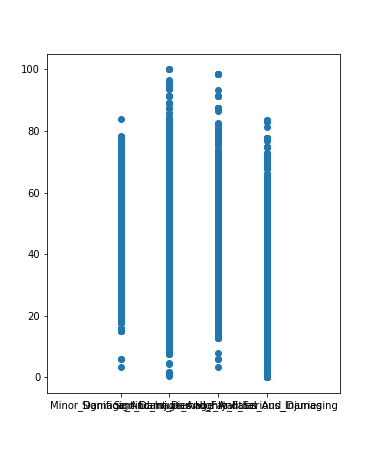

In [184]:
import matplotlib.pyplot as plt
plt.scatter(train["Severity"].astype(str), train["Safety_Score"])
plt.margins(x=0.5)
plt.show()

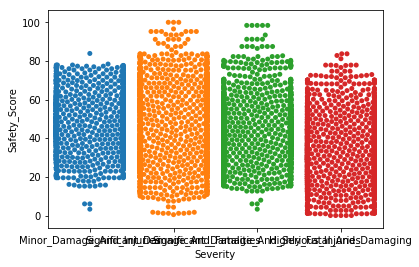

In [179]:
sns.swarmplot(x="Severity",y= "Safety_Score",data=train)


In [190]:
%matplotlib notebook

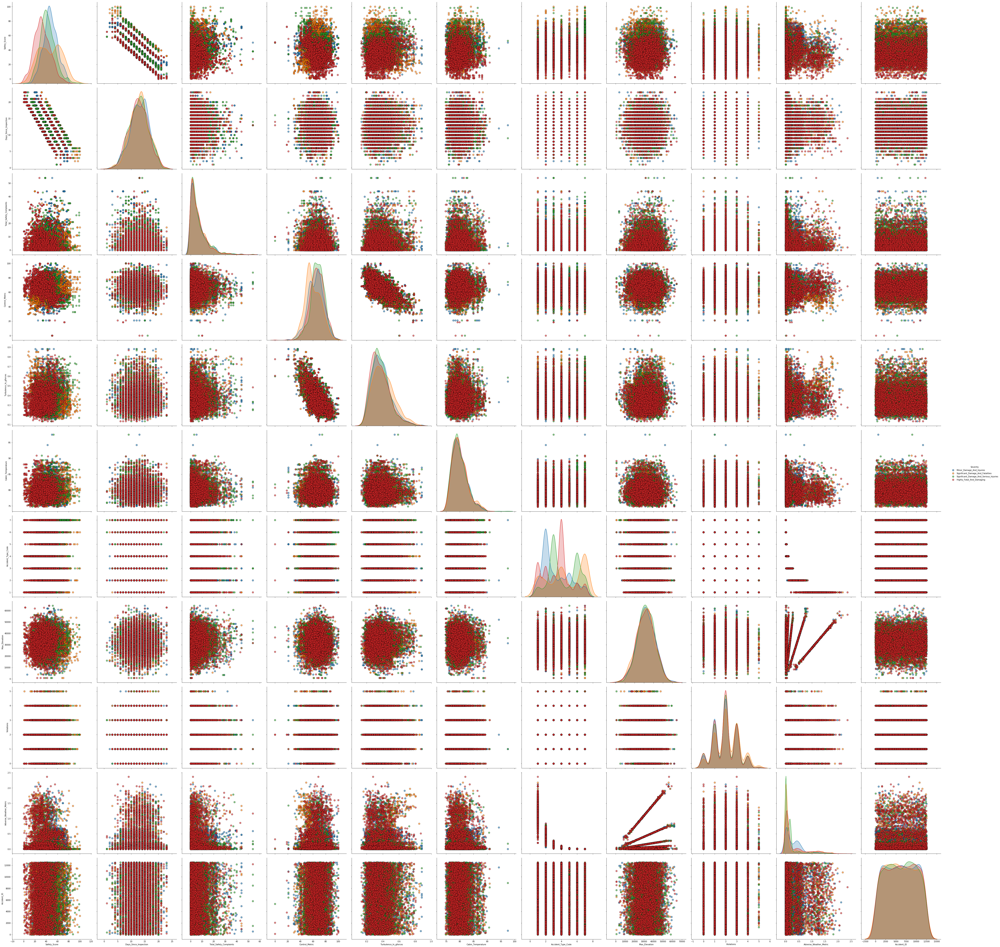

In [200]:
sns.pairplot(train, hue = 'Severity', diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size = 6)

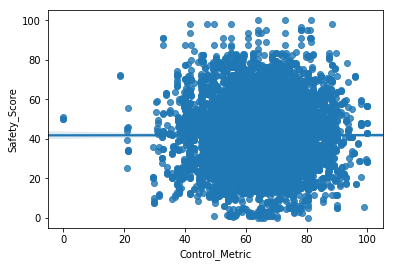

In [209]:
sns.regplot(x = train['Control_Metric'], y = train['Safety_Score'])

In [205]:
train['Accident_Type_Code'].value_counts()

4    2057
2    1791
3    1752
7    1276
6    1215
1    1171
5     738
Name: Accident_Type_Code, dtype: int64

In [366]:
data = train.copy()


In [310]:
data.columns

Index(['Severity', 'Safety_Score', 'Days_Since_Inspection',
       'Total_Safety_Complaints', 'Control_Metric', 'Turbulence_In_gforces',
       'Cabin_Temperature', 'Accident_Type_Code', 'Max_Elevation',
       'Violations', 'Adverse_Weather_Metric', 'Accident_ID'],
      dtype='object')

In [367]:
 y = data['Severity']

In [368]:
data = data.drop(['Severity','Violations','Accident_ID','Max_Elevation','Cabin_Temperature','Total_Safety_Complaints'],axis=1)

In [369]:
data.columns

Index(['Safety_Score', 'Days_Since_Inspection', 'Control_Metric',
       'Turbulence_In_gforces', 'Accident_Type_Code',
       'Adverse_Weather_Metric'],
      dtype='object')

In [370]:
from sklearn.model_selection import train_test_split

train_x,test_x,train_y,test_y =  train_test_split(data, y,  test_size=0.3)
train_df, cv_df, y_train, y_cv = train_test_split(train_x, train_y, test_size=0.2)

In [371]:
model = RandomForestClassifier(n_estimators=2000, criterion='gini', max_depth=10, random_state=42, n_jobs=-1,class_weight = "balanced")

model.fit(train_df, y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=10, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=2000, n_jobs=-1, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)

In [372]:
pred_y =model.predict(train_df)

In [373]:
print ('f1_score on train data',100*f1_score(y_train,pred_y,average='weighted'))


f1_score on train data 96.8068699120179


In [374]:
predcv_y =model.predict(cv_df)

In [375]:
print ('f1_score on cv data',100*f1_score(y_cv,predcv_y,average='weighted'))

f1_score on cv data 92.02791587280852


In [376]:
predtest_y =model.predict(test_x)

In [377]:
print ('f1_score on test_x data',100*f1_score(test_y,predtest_y,average='weighted'))

f1_score on test_x data 90.26399535964393


In [225]:
train_df.columns

Index(['Safety_Score', 'Days_Since_Inspection', 'Total_Safety_Complaints',
       'Turbulence_In_gforces', 'Cabin_Temperature', 'Accident_Type_Code',
       'Max_Elevation', 'Accident_ID'],
      dtype='object')

In [316]:
test.columns

Index(['Safety_Score', 'Days_Since_Inspection', 'Total_Safety_Complaints',
       'Control_Metric', 'Turbulence_In_gforces', 'Cabin_Temperature',
       'Accident_Type_Code', 'Max_Elevation', 'Violations',
       'Adverse_Weather_Metric'],
      dtype='object')

In [330]:
result  = test['Accident_ID']

In [379]:
test_data = test.drop(['Accident_ID','Violations','Max_Elevation','Cabin_Temperature','Total_Safety_Complaints'],axis=1)

In [380]:
test_data.columns

Index(['Safety_Score', 'Days_Since_Inspection', 'Control_Metric',
       'Turbulence_In_gforces', 'Accident_Type_Code',
       'Adverse_Weather_Metric'],
      dtype='object')

In [381]:
testpred_y =model.predict(test_data)

In [382]:
df_ss = pd.DataFrame({'Accident_ID':result,'Severity':testpred_y})



In [383]:
df_ss.to_csv(r'C:\Users\Admin\Desktop\DS Assignment\sam6.csv',index= False)

In [384]:
dff = pd.read_csv(r'C:\Users\Admin\Desktop\DS Assignment\sam6.csv')

In [385]:
dff['Severity'].value_counts()

Highly_Fatal_And_Damaging                  755
Minor_Damage_And_Injuries                  698
Significant_Damage_And_Serious_Injuries    649
Significant_Damage_And_Fatalities          398
Name: Severity, dtype: int64

In [350]:
df_ss['Severity'].value_counts()

Highly_Fatal_And_Damaging                  753
Minor_Damage_And_Injuries                  693
Significant_Damage_And_Serious_Injuries    634
Significant_Damage_And_Fatalities          420
Name: Severity, dtype: int64

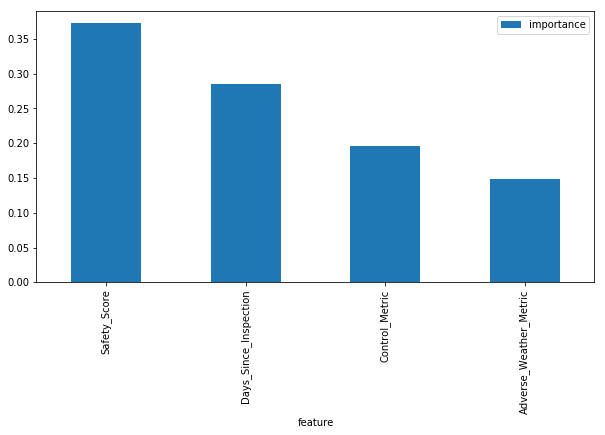

In [253]:
importances = pd.DataFrame({'feature':test_data.columns,'importance':np.round(model.feature_importances_,3)})

importances = importances.sort_values('importance',ascending=False).set_index('feature')
importances.plot.bar(figsize=(10,5))




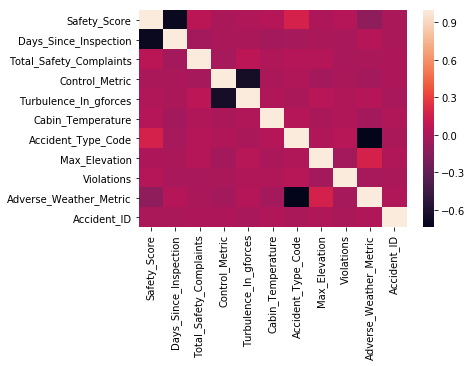

In [359]:
corr = train.corr()
sns.heatmap(corr)

In [365]:
print (corr['Adverse_Weather_Metric'].sort_values(ascending=False))

Adverse_Weather_Metric     1.000000
Max_Elevation              0.173436
Days_Since_Inspection      0.040804
Turbulence_In_gforces      0.039802
Accident_ID                0.008586
Total_Safety_Complaints   -0.002713
Violations                -0.021578
Cabin_Temperature         -0.026647
Control_Metric            -0.028296
Safety_Score              -0.107925
Accident_Type_Code        -0.739361
Name: Adverse_Weather_Metric, dtype: float64


In [4]:
df=train.append(test,ignore_index=True)

In [5]:
df.shape

(12500, 12)

In [8]:
df.columns

Index(['Accident_ID', 'Accident_Type_Code', 'Adverse_Weather_Metric',
       'Cabin_Temperature', 'Control_Metric', 'Days_Since_Inspection',
       'Max_Elevation', 'Safety_Score', 'Severity', 'Total_Safety_Complaints',
       'Turbulence_In_gforces', 'Violations'],
      dtype='object')

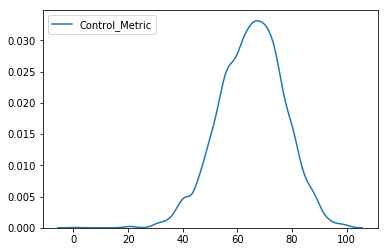

In [9]:
sns.kdeplot(df['Control_Metric'])

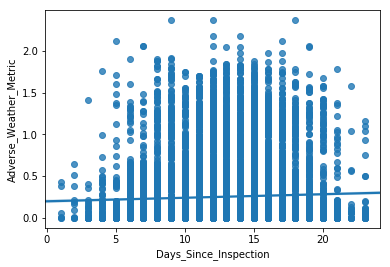

In [15]:
sns.regplot(x = "Days_Since_Inspection",y = "Adverse_Weather_Metric", data = df)